# Copernicus Python API Examples

In [1]:
import sys
sys.path.insert(0, "C:\\Users\\MBF\\Documents\\neuronunit")

In [35]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import matplotlib.pyplot as plt
import sciunit
import seaborn as sns
sns.set(font_scale=1.5)
import copernicus as cop

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
cop.DATA_ROOT

WindowsPath('c:/users/mbf/documents/copyrnicus/data')

### Set a location for the current dataset

In [5]:
cop.DATA = cop.DATA_ROOT / 'ExportedDorsoventralData'
assert cop.DATA.exists()

### Load all sweeps from a given experiment in the dataset

In [6]:
sweeps = cop.matfile_to_sweeps('MOB021319', layer=0)
sweeps.head()

,Sweep 1,Sweep 2,Sweep 3,Sweep 4,Sweep 5,Sweep 6,Sweep 7,Sweep 8,Sweep 9,Sweep 10,...,Sweep 21,Sweep 22,Sweep 23,Sweep 24,Sweep 25,Sweep 26,Sweep 27,Sweep 28,Sweep 29,Sweep 30
Time (s),,,,,,,,,,,,,,,,,,,,,
0.0000,-43.81250,-49.46875,-49.28125,-48.31250,-48.62500,-49.09375,-48.71875,-48.46875,-48.90625,-47.87500,...,-46.65625,-47.00000,-47.28125,-48.03125,-47.56250,-47.53125,-47.37500,-46.15625,-45.68750,-47.78125
0.0001,-43.53125,-49.40625,-49.28125,-48.37500,-48.68750,-49.15625,-48.71875,-48.50000,-48.90625,-47.84375,...,-46.71875,-47.03125,-47.28125,-48.00000,-47.56250,-47.56250,-47.34375,-46.18750,-45.71875,-47.84375
0.0002,-43.59375,-49.46875,-49.31250,-48.43750,-48.65625,-49.15625,-48.71875,-48.46875,-48.87500,-47.87500,...,-46.71875,-47.00000,-47.28125,-48.00000,-47.50000,-47.53125,-47.34375,-46.15625,-45.68750,-47.81250
0.0003,-43.59375,-49.46875,-49.28125,-48.40625,-48.62500,-49.12500,-48.68750,-48.46875,-48.96875,-47.96875,...,-46.65625,-47.03125,-47.25000,-47.96875,-47.56250,-47.50000,-47.43750,-46.18750,-45.71875,-47.81250
0.0004,-43.59375,-49.46875,-49.18750,-48.40625,-48.59375,-49.09375,-48.75000,-48.50000,-48.93750,-47.93750,...,-46.68750,-46.96875,-47.31250,-47.96875,-47.53125,-47.53125,-47.34375,-46.18750,-45.71875,-47.78125


### Load sweeps from a given experiment in the dataset, for a specific protocol used in that experiment

In [7]:
sweeps = cop.protocol_to_sweeps('MOB021319', 'Depolarize')
sweeps.head()

,Sweep 1,Sweep 2,Sweep 3,Sweep 4,Sweep 5,Sweep 6,Sweep 7,Sweep 8,Sweep 9,Sweep 10,...,Sweep 63,Sweep 64,Sweep 65,Sweep 66,Sweep 67,Sweep 68,Sweep 69,Sweep 70,Sweep 71,Sweep 72
Time (s),,,,,,,,,,,,,,,,,,,,,
0.0000,-49.53125,-50.46875,-50.93750,-50.68750,-48.96875,-50.50000,-50.46875,-51.18750,-51.15625,-49.15625,...,-49.03125,-47.31250,-48.62500,-48.96875,-47.75000,-47.96875,-48.59375,-48.03125,-47.62500,-47.81250
0.0001,-49.53125,-50.37500,-50.90625,-50.68750,-48.96875,-50.50000,-50.37500,-51.21875,-51.09375,-49.18750,...,-49.03125,-47.28125,-48.56250,-48.96875,-47.71875,-47.96875,-48.59375,-47.96875,-47.56250,-47.84375
0.0002,-49.43750,-50.43750,-50.93750,-50.68750,-48.93750,-50.50000,-50.37500,-51.18750,-51.15625,-49.18750,...,-49.03125,-47.34375,-48.65625,-48.96875,-47.78125,-48.00000,-48.65625,-47.96875,-47.59375,-47.84375
0.0003,-49.46875,-50.43750,-50.90625,-50.71875,-48.90625,-50.50000,-50.40625,-51.15625,-51.09375,-49.21875,...,-49.09375,-47.28125,-48.50000,-48.96875,-47.78125,-48.03125,-48.62500,-47.96875,-47.59375,-47.81250
0.0004,-49.43750,-50.40625,-50.93750,-50.71875,-48.87500,-50.46875,-50.37500,-51.15625,-51.09375,-49.15625,...,-49.06250,-47.34375,-48.56250,-48.90625,-47.71875,-48.06250,-48.68750,-47.93750,-47.62500,-47.81250


### Quick summary of these swweeps in compact graphical form

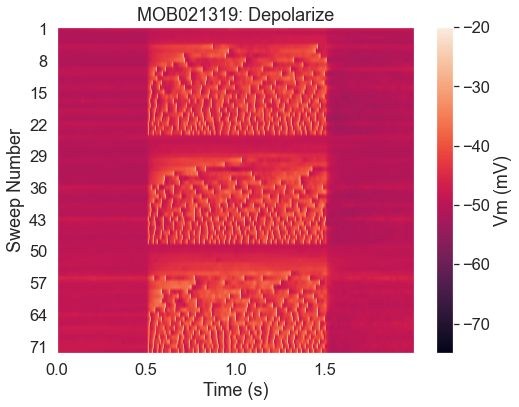

In [8]:
cop.sweeps_to_image(sweeps)

### Load all experimental recordings from the current experiment directory

In [13]:
recordings = cop.get_recordings()
"There are %d sets of recordings." % len(recordings)

'There are 30 sets of recordings.'

### Summarize all of these experiments compactly, for one protocol ('spontaneous')

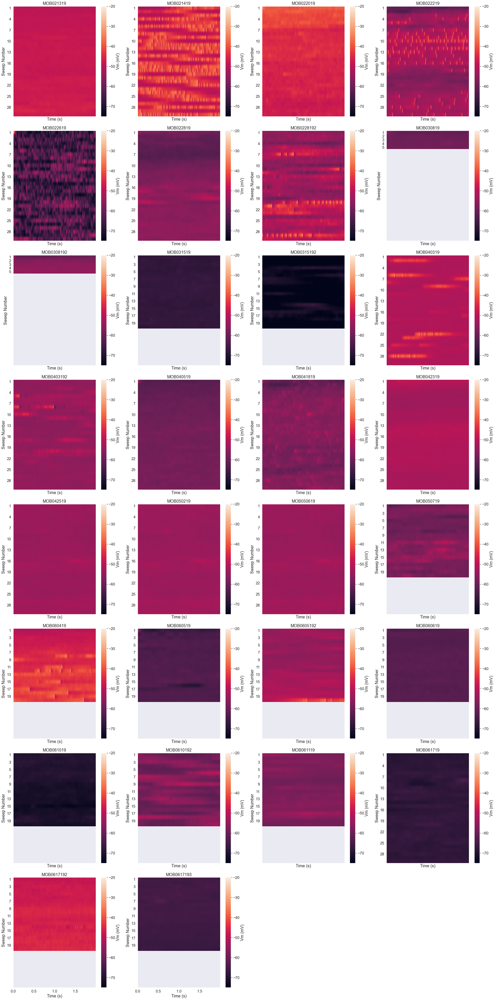

In [14]:
cop.make_summary(recordings, 'spontaneous', max_sweeps=30)

### Summarize all of these experiments compactly, for one protocol ('Depolarize')

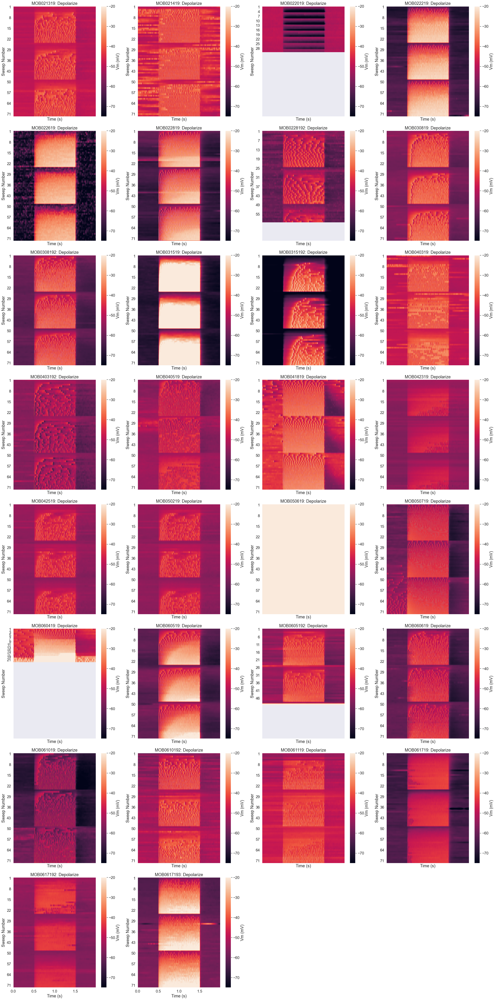

In [15]:
cop.make_summary(recordings, 'Depolarize', max_sweeps=72)

### Same summary as above, but with Vm traces instead of a heatmap

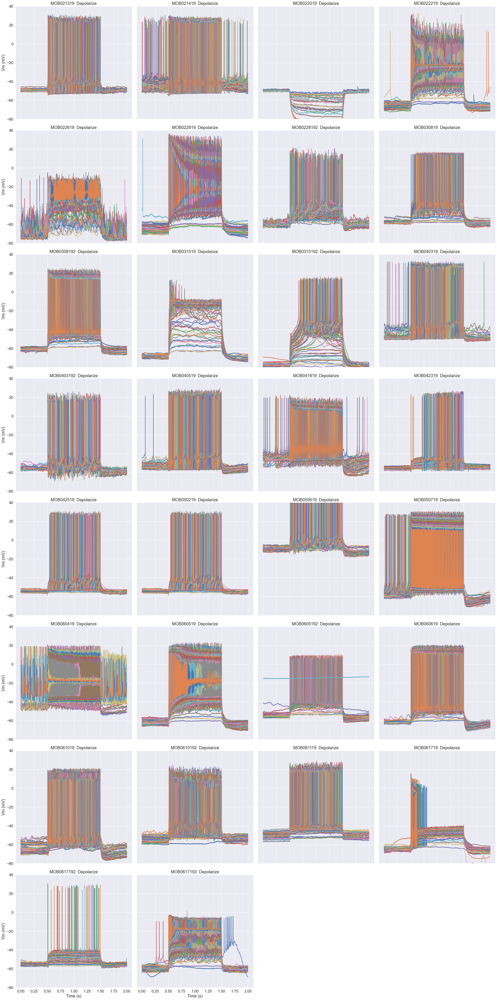

In [16]:
cop.make_plot_summary(recordings, 'Depolarize')

### Select sweeps for the 'Depolarize' protocol for a different experiment

In [17]:
sweeps = cop.protocol_to_sweeps('MOB0315192', 'Depolarize')

### Extract a single spike train (spike times) from a single sweep (sweep 15)

In [18]:
vm = cop.sweep_to_neo(sweeps, 15)  # This is the membrane potential for sweep 15
spike_train = cop.spike_extraction(vm)  # This is the spike train for sweep 15
spike_train

SpikeTrain

### Show that protocol, and look at sweep 15 to see if spike times match up

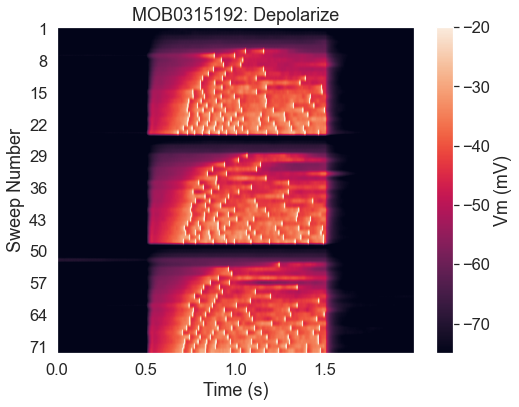

In [19]:
cop.sweeps_to_image(sweeps)

### Count the number of stray spikes (outside the bounds provided)

In [20]:
cop.count_stray_spikes(vm, 0.5, 1.5)  # 0.5s to 1.5s is the stimulation region where spikes are expected

0

### Get the holding potential, defined as occurring before the given stimulation time

In [21]:
cop.get_holding_potential(vm, 0.5)  # 0.5s is the stimulation time

array(-77.9896875) * mV

### Get the spike count by each possible spike-counting threshold

In [22]:
cop.get_spike_count_by_threshold(vm)  # threshold:spike_count pairs

{-30.0: 5, -20.0: 5, -10.0: 5, 0.0: 5, 10.0: 5}

### Spike Height Health is reflected by a sharp change in the number of spikes at some threshold, i.e. a consistent spike height

c:\users\mbf\documents\copyrnicus\copernicus\__init__.py:153: RuntimeWarning: invalid value encountered in double_scalars
  return np.exp(-counts.std() / counts.mean())
c:\users\mbf\documents\copyrnicus\copernicus\__init__.py:153: RuntimeWarning: invalid value encountered in double_scalars
  return np.exp(-counts.std() / counts.mean())
c:\users\mbf\documents\copyrnicus\copernicus\__init__.py:153: RuntimeWarning: invalid value encountered in double_scalars
  return np.exp(-counts.std() / counts.mean())
c:\users\mbf\documents\copyrnicus\copernicus\__init__.py:153: RuntimeWarning: invalid value encountered in double_scalars
  return np.exp(-counts.std() / counts.mean())


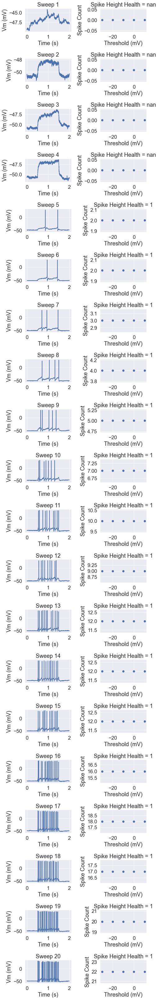

In [23]:
sweeps = cop.protocol_to_sweeps('MOB021319', 'Depolarize')
cop.plot_spike_height_health(sweeps)

c:\users\mbf\documents\copyrnicus\copernicus\__init__.py:153: RuntimeWarning: invalid value encountered in double_scalars
  return np.exp(-counts.std() / counts.mean())
C:\Miniconda3\lib\site-packages\elephant\spike_train_generation.py:98: UserWarning: Waveforms overlap.
  warnings.warn("Waveforms overlap.", UserWarning)
C:\Miniconda3\lib\site-packages\elephant\spike_train_generation.py:98: UserWarning: Waveforms overlap.
  warnings.warn("Waveforms overlap.", UserWarning)
C:\Miniconda3\lib\site-packages\elephant\spike_train_generation.py:98: UserWarning: Waveforms overlap.
  warnings.warn("Waveforms overlap.", UserWarning)
C:\Miniconda3\lib\site-packages\elephant\spike_train_generation.py:98: UserWarning: Waveforms overlap.
  warnings.warn("Waveforms overlap.", UserWarning)
C:\Miniconda3\lib\site-packages\elephant\spike_train_generation.py:98: UserWarning: Waveforms overlap.
  warnings.warn("Waveforms overlap.", UserWarning)


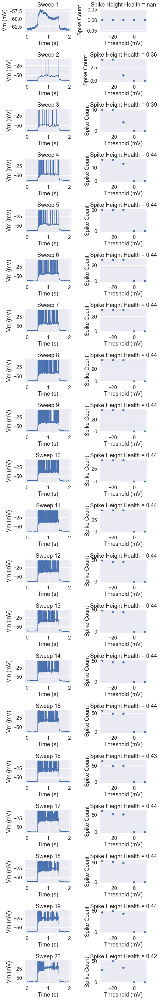

In [24]:
sweeps = cop.protocol_to_sweeps('MOB0617193', 'Depolarize')
cop.plot_spike_height_health(sweeps)

### Create static models of the data that can be tested for agreement with certain spike health requirements

In [30]:
#!pip install --user -e ~/dev/scidash/neuronunit

In [42]:
sweeps = cop.protocol_to_sweeps('MOB021319', 'Depolarize')
vm = cop.sweep_to_neo(sweeps, 19)
model = cop.IBWModel(vm)
model.name = 'Sweep 19'

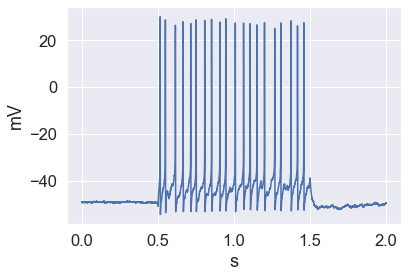

In [43]:
cop.bbp.plot_data(vm)

### Test a static model of sweep 19 for appropriate spike amplitude

In [49]:
import quantities as pq
from neuronunit.tests.waveform import InjectedCurrentAPWidthTest, InjectedCurrentAPAmplitudeTest
from neuronunit.tests.passive import RestingPotentialTest
test = InjectedCurrentAPAmplitudeTest(observation={'mean': 10*pq.mV, 'std': 20*pq.mV})
s = test.judge(model)

In [51]:
pq.ms

UnitTime('millisecond', 0.001 * s, 'ms')

### Test it for appropriate spike amplitude and width

In [52]:
test1 = InjectedCurrentAPAmplitudeTest(observation={'mean': 10*pq.mV, 'std': 20*pq.mV})
test2 = InjectedCurrentAPWidthTest(observation={'mean': 1.5*pq.ms, 'std': 0.5*pq.ms})
test3 = RestingPotentialTest(observation={'mean': -50*pq.mV, 'std': 5*pq.mV})
suite = sciunit.TestSuite([test1, test2, test3])
suite.judge(model)

AssertionError: Model must have a `run` method to use a ProtocolToFeaturesTest

### Test both sweeps 19 and 20 for appropriate spike amplitude and width

In [37]:
vm = cop.sweep_to_neo(sweeps, 20)
model2 = cop.IBWModel(vm)
model2.name = 'Sweep 20'
suite.judge([model, model2])

,InjectedCurrentAPAmplitudeTest,InjectedCurrentAPWidthTest
Sweep 19,Z = 2.28,Z = -1.48
Sweep 20,Z = 2.29,Z = -1.55


### Example of loading and plotting a single .ibw from a file

Wall time: 1.99 ms


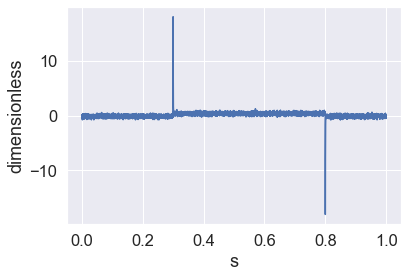

In [41]:
from pathlib import Path
curr_exp = "2020_12_15_c"
curr_exp_path = Path("C:\\Users\\MBF\\Desktop\\%s Folder" % curr_exp)
posix_path = curr_exp_path / 'Chan_0' / 'sweep3.ibw'
%time vm = cop.bbp.open_data(str(posix_path))
cop.bbp.plot_data(vm)